In [2]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from torchvision import datasets, models, transforms, utils
import shutil
import os
import torch
import torch.nn as nn
import time
import copy
import torch.optim as optim
from torch.optim import lr_scheduler

In [6]:
datasetPath = Path('./RMFD/self-built-masked-face-recognition-dataset')
maskPath = datasetPath/'AFDB_masked_face_dataset'
nonMaskPath = datasetPath/'AFDB_face_dataset'
maskDF = pd.DataFrame()

for subject in tqdm(list(maskPath.iterdir()), desc='mask photos'):
    for imgPath in subject.iterdir():
        maskDF = maskDF.append({
            'image': str(imgPath),
            'mask': 1
        }, ignore_index=True)

for subject in tqdm(list(nonMaskPath.iterdir()), desc='non mask photos'):
    for imgPath in subject.iterdir():
        maskDF = maskDF.append({
            'image': str(imgPath),
            'mask': 0
        }, ignore_index=True)

non mask photos:   2%|▏         | 11/460 [00:04<02:57,  2.54it/s]


KeyboardInterrupt: 

In [2]:
dfName = 'mask_df.pickle'
print(f'saving Dataframe to: {dfName}')
maskDF.to_pickle(dfName)

maskDF.head()

saving Dataframe to: mask_df.pickle


,image,mask
0,RMFD/self-built-masked-face-recognition-datase...,1.0
1,RMFD/self-built-masked-face-recognition-datase...,1.0
2,RMFD/self-built-masked-face-recognition-datase...,1.0
3,RMFD/self-built-masked-face-recognition-datase...,1.0
4,RMFD/self-built-masked-face-recognition-datase...,1.0


In [4]:
maskDF.iloc[1,0]

'RMFD/self-built-masked-face-recognition-dataset/AFDB_masked_face_dataset/huangzongze/1_0_2.jpg'

In [4]:
data_transforms = {
    'train': transforms.Compose([
            transforms.Resize((100, 100)),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]), 
    'test' : transforms.Compose([
            transforms.Resize((100, 100)),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
}

In [18]:
def prepare_data(maskDFPath) -> None:
    """ Prepare train/test datasets and calculate weight vector
        for CrossEntropyLoss
    """
    maskDF = pd.read_pickle(maskDFPath)
    train, validate = train_test_split(maskDF, test_size=0.3, random_state=0,
                                       stratify=maskDF['mask'])
#     trainDF = MaskDataset(train)
#     validateDF = MaskDataset(validate)
    return train, validate, maskDF
    
train, validate, maskDF = prepare_data('./mask_df.pickle')

In [21]:
train.to_csv('./train.csv', index=False)
validate.to_csv('./test.csv', index=False)

In [69]:
train.head()

,image,mask
55198,RMFD/self-built-masked-face-recognition-datase...,0.0
3248,RMFD/self-built-masked-face-recognition-datase...,0.0
6235,RMFD/self-built-masked-face-recognition-datase...,0.0
28337,RMFD/self-built-masked-face-recognition-datase...,0.0
57594,RMFD/self-built-masked-face-recognition-datase...,0.0


In [89]:
maskDF.shape 

(92671, 2)

In [33]:
train.shape

(64869, 2)

In [82]:
validate.shape

(27802, 2)

In [32]:
train['mask'].value_counts()

0.0    63327
1.0     1542
Name: mask, dtype: int64

In [50]:
for _, row in train.iterrows():
    source_path = row['image']
    label = row['mask']
    if label == 0.0:
        dest_path = './train/non_masked/'
    else:
        dest_path = './train/masked/'
    shutil.copy(source_path, dest_path)

In [79]:
def get_train_files_path(experiments_path, data_path):
    train_df = pd.read_csv(experiments_path, delimiter=',')
    paths = []
    labels = []
    for row in train_df.iterrows():
        print(row)
        paths.append(row[1]['image'])
        labels.append(str(row[1]['mask']))
    
    return paths, labels

X_train, y_train = get_train_files_path('./train.csv', './train')

(0, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 0, dtype: object)
(1, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1, dtype: object)
(2, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2, dtype: object)
(3, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3, dtype: object)
(4, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4, dtype: object)
(5, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5, dtype: object)
(6, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Na

Name: 488, dtype: object)
(489, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 489, dtype: object)
(490, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 490, dtype: object)
(491, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 491, dtype: object)
(492, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 492, dtype: object)
(493, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 493, dtype: object)
(494, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 494, dtype: object)
(495, image    RMFD/self-built-masked-face-recognition-datase...
mask     

Name: 972, dtype: object)
(973, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 973, dtype: object)
(974, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 974, dtype: object)
(975, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 975, dtype: object)
(976, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 976, dtype: object)
(977, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 977, dtype: object)
(978, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 978, dtype: object)
(979, image    RMFD/self-built-masked-face-recognition-datase...
mask     

Name: 1459, dtype: object)
(1460, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1460, dtype: object)
(1461, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1461, dtype: object)
(1462, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1462, dtype: object)
(1463, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 1463, dtype: object)
(1464, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1464, dtype: object)
(1465, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1465, dtype: object)
(1466, image    RMFD/self-built-masked-face-recognition-datas

Name: 1939, dtype: object)
(1940, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1940, dtype: object)
(1941, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1941, dtype: object)
(1942, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1942, dtype: object)
(1943, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1943, dtype: object)
(1944, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1944, dtype: object)
(1945, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1945, dtype: object)
(1946, image    RMFD/self-built-masked-face-recognition-datas

Name: 2426, dtype: object)
(2427, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2427, dtype: object)
(2428, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2428, dtype: object)
(2429, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2429, dtype: object)
(2430, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2430, dtype: object)
(2431, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2431, dtype: object)
(2432, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2432, dtype: object)
(2433, image    RMFD/self-built-masked-face-recognition-datas

Name: 2890, dtype: object)
(2891, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2891, dtype: object)
(2892, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2892, dtype: object)
(2893, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2893, dtype: object)
(2894, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2894, dtype: object)
(2895, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2895, dtype: object)
(2896, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2896, dtype: object)
(2897, image    RMFD/self-built-masked-face-recognition-datas

Name: 3363, dtype: object)
(3364, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3364, dtype: object)
(3365, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3365, dtype: object)
(3366, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3366, dtype: object)
(3367, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3367, dtype: object)
(3368, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3368, dtype: object)
(3369, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3369, dtype: object)
(3370, image    RMFD/self-built-masked-face-recognition-datas

Name: 3837, dtype: object)
(3838, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3838, dtype: object)
(3839, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3839, dtype: object)
(3840, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3840, dtype: object)
(3841, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3841, dtype: object)
(3842, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3842, dtype: object)
(3843, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3843, dtype: object)
(3844, image    RMFD/self-built-masked-face-recognition-datas

Name: 4314, dtype: object)
(4315, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4315, dtype: object)
(4316, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4316, dtype: object)
(4317, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4317, dtype: object)
(4318, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4318, dtype: object)
(4319, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4319, dtype: object)
(4320, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4320, dtype: object)
(4321, image    RMFD/self-built-masked-face-recognition-datas

Name: 4795, dtype: object)
(4796, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4796, dtype: object)
(4797, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4797, dtype: object)
(4798, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4798, dtype: object)
(4799, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4799, dtype: object)
(4800, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4800, dtype: object)
(4801, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4801, dtype: object)
(4802, image    RMFD/self-built-masked-face-recognition-datas

Name: 5287, dtype: object)
(5288, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5288, dtype: object)
(5289, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5289, dtype: object)
(5290, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5290, dtype: object)
(5291, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5291, dtype: object)
(5292, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5292, dtype: object)
(5293, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5293, dtype: object)
(5294, image    RMFD/self-built-masked-face-recognition-datas

Name: 5777, dtype: object)
(5778, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5778, dtype: object)
(5779, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5779, dtype: object)
(5780, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5780, dtype: object)
(5781, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5781, dtype: object)
(5782, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5782, dtype: object)
(5783, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5783, dtype: object)
(5784, image    RMFD/self-built-masked-face-recognition-datas

Name: 6242, dtype: object)
(6243, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6243, dtype: object)
(6244, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6244, dtype: object)
(6245, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6245, dtype: object)
(6246, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6246, dtype: object)
(6247, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6247, dtype: object)
(6248, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6248, dtype: object)
(6249, image    RMFD/self-built-masked-face-recognition-datas

Name: 6692, dtype: object)
(6693, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6693, dtype: object)
(6694, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6694, dtype: object)
(6695, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6695, dtype: object)
(6696, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6696, dtype: object)
(6697, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6697, dtype: object)
(6698, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6698, dtype: object)
(6699, image    RMFD/self-built-masked-face-recognition-datas

Name: 7165, dtype: object)
(7166, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7166, dtype: object)
(7167, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7167, dtype: object)
(7168, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7168, dtype: object)
(7169, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7169, dtype: object)
(7170, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7170, dtype: object)
(7171, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7171, dtype: object)
(7172, image    RMFD/self-built-masked-face-recognition-datas

Name: 7645, dtype: object)
(7646, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7646, dtype: object)
(7647, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7647, dtype: object)
(7648, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7648, dtype: object)
(7649, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7649, dtype: object)
(7650, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7650, dtype: object)
(7651, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7651, dtype: object)
(7652, image    RMFD/self-built-masked-face-recognition-datas

Name: 8131, dtype: object)
(8132, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8132, dtype: object)
(8133, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8133, dtype: object)
(8134, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8134, dtype: object)
(8135, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8135, dtype: object)
(8136, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8136, dtype: object)
(8137, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8137, dtype: object)
(8138, image    RMFD/self-built-masked-face-recognition-datas

Name: 8612, dtype: object)
(8613, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8613, dtype: object)
(8614, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8614, dtype: object)
(8615, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8615, dtype: object)
(8616, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8616, dtype: object)
(8617, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8617, dtype: object)
(8618, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8618, dtype: object)
(8619, image    RMFD/self-built-masked-face-recognition-datas

Name: 9106, dtype: object)
(9107, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9107, dtype: object)
(9108, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9108, dtype: object)
(9109, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9109, dtype: object)
(9110, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9110, dtype: object)
(9111, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9111, dtype: object)
(9112, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9112, dtype: object)
(9113, image    RMFD/self-built-masked-face-recognition-datas

Name: 9597, dtype: object)
(9598, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9598, dtype: object)
(9599, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9599, dtype: object)
(9600, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9600, dtype: object)
(9601, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9601, dtype: object)
(9602, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9602, dtype: object)
(9603, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 9603, dtype: object)
(9604, image    RMFD/self-built-masked-face-recognition-datas

Name: 10078, dtype: object)
(10079, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10079, dtype: object)
(10080, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10080, dtype: object)
(10081, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10081, dtype: object)
(10082, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10082, dtype: object)
(10083, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10083, dtype: object)
(10084, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10084, dtype: object)
(10085, image    RMFD/self-built-masked-face-rec

Name: 10554, dtype: object)
(10555, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10555, dtype: object)
(10556, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10556, dtype: object)
(10557, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10557, dtype: object)
(10558, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10558, dtype: object)
(10559, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10559, dtype: object)
(10560, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10560, dtype: object)
(10561, image    RMFD/self-built-masked-face-rec

Name: 11032, dtype: object)
(11033, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11033, dtype: object)
(11034, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11034, dtype: object)
(11035, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11035, dtype: object)
(11036, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11036, dtype: object)
(11037, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11037, dtype: object)
(11038, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11038, dtype: object)
(11039, image    RMFD/self-built-masked-face-rec

Name: 11525, dtype: object)
(11526, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11526, dtype: object)
(11527, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11527, dtype: object)
(11528, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11528, dtype: object)
(11529, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11529, dtype: object)
(11530, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11530, dtype: object)
(11531, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11531, dtype: object)
(11532, image    RMFD/self-built-masked-face-rec

Name: 12012, dtype: object)
(12013, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 12013, dtype: object)
(12014, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12014, dtype: object)
(12015, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12015, dtype: object)
(12016, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12016, dtype: object)
(12017, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12017, dtype: object)
(12018, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12018, dtype: object)
(12019, image    RMFD/self-built-masked-face-rec

Name: 12505, dtype: object)
(12506, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12506, dtype: object)
(12507, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12507, dtype: object)
(12508, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12508, dtype: object)
(12509, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 12509, dtype: object)
(12510, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12510, dtype: object)
(12511, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12511, dtype: object)
(12512, image    RMFD/self-built-masked-face-rec

Name: 12985, dtype: object)
(12986, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12986, dtype: object)
(12987, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12987, dtype: object)
(12988, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12988, dtype: object)
(12989, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12989, dtype: object)
(12990, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12990, dtype: object)
(12991, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 12991, dtype: object)
(12992, image    RMFD/self-built-masked-face-rec

Name: 13459, dtype: object)
(13460, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13460, dtype: object)
(13461, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13461, dtype: object)
(13462, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13462, dtype: object)
(13463, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13463, dtype: object)
(13464, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13464, dtype: object)
(13465, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13465, dtype: object)
(13466, image    RMFD/self-built-masked-face-rec

Name: 13943, dtype: object)
(13944, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13944, dtype: object)
(13945, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13945, dtype: object)
(13946, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13946, dtype: object)
(13947, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13947, dtype: object)
(13948, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13948, dtype: object)
(13949, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13949, dtype: object)
(13950, image    RMFD/self-built-masked-face-rec

Name: 14416, dtype: object)
(14417, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14417, dtype: object)
(14418, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14418, dtype: object)
(14419, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14419, dtype: object)
(14420, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 14420, dtype: object)
(14421, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14421, dtype: object)
(14422, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14422, dtype: object)
(14423, image    RMFD/self-built-masked-face-rec

Name: 14899, dtype: object)
(14900, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14900, dtype: object)
(14901, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14901, dtype: object)
(14902, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14902, dtype: object)
(14903, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14903, dtype: object)
(14904, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14904, dtype: object)
(14905, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14905, dtype: object)
(14906, image    RMFD/self-built-masked-face-rec

Name: 15382, dtype: object)
(15383, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15383, dtype: object)
(15384, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15384, dtype: object)
(15385, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15385, dtype: object)
(15386, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15386, dtype: object)
(15387, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15387, dtype: object)
(15388, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15388, dtype: object)
(15389, image    RMFD/self-built-masked-face-rec

Name: 15871, dtype: object)
(15872, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15872, dtype: object)
(15873, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15873, dtype: object)
(15874, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15874, dtype: object)
(15875, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15875, dtype: object)
(15876, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15876, dtype: object)
(15877, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15877, dtype: object)
(15878, image    RMFD/self-built-masked-face-rec

Name: 16354, dtype: object)
(16355, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16355, dtype: object)
(16356, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16356, dtype: object)
(16357, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16357, dtype: object)
(16358, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16358, dtype: object)
(16359, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16359, dtype: object)
(16360, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16360, dtype: object)
(16361, image    RMFD/self-built-masked-face-rec

Name: 16815, dtype: object)
(16816, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16816, dtype: object)
(16817, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16817, dtype: object)
(16818, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16818, dtype: object)
(16819, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16819, dtype: object)
(16820, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16820, dtype: object)
(16821, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16821, dtype: object)
(16822, image    RMFD/self-built-masked-face-rec

Name: 17270, dtype: object)
(17271, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17271, dtype: object)
(17272, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17272, dtype: object)
(17273, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17273, dtype: object)
(17274, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17274, dtype: object)
(17275, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17275, dtype: object)
(17276, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17276, dtype: object)
(17277, image    RMFD/self-built-masked-face-rec

Name: 17739, dtype: object)
(17740, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17740, dtype: object)
(17741, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17741, dtype: object)
(17742, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17742, dtype: object)
(17743, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17743, dtype: object)
(17744, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17744, dtype: object)
(17745, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17745, dtype: object)
(17746, image    RMFD/self-built-masked-face-rec

Name: 18236, dtype: object)
(18237, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18237, dtype: object)
(18238, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18238, dtype: object)
(18239, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 18239, dtype: object)
(18240, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18240, dtype: object)
(18241, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18241, dtype: object)
(18242, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18242, dtype: object)
(18243, image    RMFD/self-built-masked-face-rec

Name: 18670, dtype: object)
(18671, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18671, dtype: object)
(18672, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18672, dtype: object)
(18673, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18673, dtype: object)
(18674, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18674, dtype: object)
(18675, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18675, dtype: object)
(18676, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18676, dtype: object)
(18677, image    RMFD/self-built-masked-face-rec

Name: 19125, dtype: object)
(19126, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19126, dtype: object)
(19127, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19127, dtype: object)
(19128, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19128, dtype: object)
(19129, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19129, dtype: object)
(19130, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19130, dtype: object)
(19131, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19131, dtype: object)
(19132, image    RMFD/self-built-masked-face-rec

Name: 19581, dtype: object)
(19582, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19582, dtype: object)
(19583, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19583, dtype: object)
(19584, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19584, dtype: object)
(19585, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19585, dtype: object)
(19586, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19586, dtype: object)
(19587, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19587, dtype: object)
(19588, image    RMFD/self-built-masked-face-rec

Name: 20053, dtype: object)
(20054, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20054, dtype: object)
(20055, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20055, dtype: object)
(20056, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20056, dtype: object)
(20057, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20057, dtype: object)
(20058, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20058, dtype: object)
(20059, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20059, dtype: object)
(20060, image    RMFD/self-built-masked-face-rec

Name: 20507, dtype: object)
(20508, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20508, dtype: object)
(20509, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20509, dtype: object)
(20510, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20510, dtype: object)
(20511, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20511, dtype: object)
(20512, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20512, dtype: object)
(20513, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20513, dtype: object)
(20514, image    RMFD/self-built-masked-face-rec

Name: 20955, dtype: object)
(20956, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20956, dtype: object)
(20957, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20957, dtype: object)
(20958, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20958, dtype: object)
(20959, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20959, dtype: object)
(20960, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20960, dtype: object)
(20961, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20961, dtype: object)
(20962, image    RMFD/self-built-masked-face-rec

Name: 21380, dtype: object)
(21381, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21381, dtype: object)
(21382, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21382, dtype: object)
(21383, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21383, dtype: object)
(21384, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21384, dtype: object)
(21385, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21385, dtype: object)
(21386, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21386, dtype: object)
(21387, image    RMFD/self-built-masked-face-rec

Name: 21834, dtype: object)
(21835, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21835, dtype: object)
(21836, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 21836, dtype: object)
(21837, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21837, dtype: object)
(21838, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21838, dtype: object)
(21839, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21839, dtype: object)
(21840, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21840, dtype: object)
(21841, image    RMFD/self-built-masked-face-rec

Name: 22272, dtype: object)
(22273, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 22273, dtype: object)
(22274, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22274, dtype: object)
(22275, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22275, dtype: object)
(22276, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22276, dtype: object)
(22277, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22277, dtype: object)
(22278, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22278, dtype: object)
(22279, image    RMFD/self-built-masked-face-rec

Name: 22738, dtype: object)
(22739, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22739, dtype: object)
(22740, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22740, dtype: object)
(22741, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22741, dtype: object)
(22742, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22742, dtype: object)
(22743, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22743, dtype: object)
(22744, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22744, dtype: object)
(22745, image    RMFD/self-built-masked-face-rec

Name: 23216, dtype: object)
(23217, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23217, dtype: object)
(23218, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23218, dtype: object)
(23219, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23219, dtype: object)
(23220, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23220, dtype: object)
(23221, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23221, dtype: object)
(23222, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23222, dtype: object)
(23223, image    RMFD/self-built-masked-face-rec

Name: 23701, dtype: object)
(23702, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23702, dtype: object)
(23703, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23703, dtype: object)
(23704, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23704, dtype: object)
(23705, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23705, dtype: object)
(23706, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23706, dtype: object)
(23707, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23707, dtype: object)
(23708, image    RMFD/self-built-masked-face-rec

Name: 24184, dtype: object)
(24185, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24185, dtype: object)
(24186, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 24186, dtype: object)
(24187, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24187, dtype: object)
(24188, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24188, dtype: object)
(24189, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24189, dtype: object)
(24190, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24190, dtype: object)
(24191, image    RMFD/self-built-masked-face-rec

Name: 24666, dtype: object)
(24667, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24667, dtype: object)
(24668, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24668, dtype: object)
(24669, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24669, dtype: object)
(24670, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24670, dtype: object)
(24671, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24671, dtype: object)
(24672, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24672, dtype: object)
(24673, image    RMFD/self-built-masked-face-rec

Name: 25137, dtype: object)
(25138, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25138, dtype: object)
(25139, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25139, dtype: object)
(25140, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25140, dtype: object)
(25141, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25141, dtype: object)
(25142, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25142, dtype: object)
(25143, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25143, dtype: object)
(25144, image    RMFD/self-built-masked-face-rec

Name: 25619, dtype: object)
(25620, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 25620, dtype: object)
(25621, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25621, dtype: object)
(25622, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25622, dtype: object)
(25623, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25623, dtype: object)
(25624, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25624, dtype: object)
(25625, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25625, dtype: object)
(25626, image    RMFD/self-built-masked-face-rec

Name: 26104, dtype: object)
(26105, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26105, dtype: object)
(26106, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26106, dtype: object)
(26107, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26107, dtype: object)
(26108, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26108, dtype: object)
(26109, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26109, dtype: object)
(26110, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26110, dtype: object)
(26111, image    RMFD/self-built-masked-face-rec

Name: 26585, dtype: object)
(26586, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26586, dtype: object)
(26587, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26587, dtype: object)
(26588, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26588, dtype: object)
(26589, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26589, dtype: object)
(26590, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26590, dtype: object)
(26591, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26591, dtype: object)
(26592, image    RMFD/self-built-masked-face-rec

Name: 27066, dtype: object)
(27067, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27067, dtype: object)
(27068, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27068, dtype: object)
(27069, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27069, dtype: object)
(27070, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27070, dtype: object)
(27071, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27071, dtype: object)
(27072, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27072, dtype: object)
(27073, image    RMFD/self-built-masked-face-rec

Name: 27541, dtype: object)
(27542, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27542, dtype: object)
(27543, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27543, dtype: object)
(27544, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27544, dtype: object)
(27545, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27545, dtype: object)
(27546, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27546, dtype: object)
(27547, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27547, dtype: object)
(27548, image    RMFD/self-built-masked-face-rec

Name: 28023, dtype: object)
(28024, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28024, dtype: object)
(28025, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28025, dtype: object)
(28026, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28026, dtype: object)
(28027, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28027, dtype: object)
(28028, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28028, dtype: object)
(28029, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28029, dtype: object)
(28030, image    RMFD/self-built-masked-face-rec

Name: 28504, dtype: object)
(28505, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28505, dtype: object)
(28506, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28506, dtype: object)
(28507, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28507, dtype: object)
(28508, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28508, dtype: object)
(28509, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28509, dtype: object)
(28510, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28510, dtype: object)
(28511, image    RMFD/self-built-masked-face-rec

Name: 28988, dtype: object)
(28989, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28989, dtype: object)
(28990, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28990, dtype: object)
(28991, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28991, dtype: object)
(28992, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28992, dtype: object)
(28993, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28993, dtype: object)
(28994, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 28994, dtype: object)
(28995, image    RMFD/self-built-masked-face-rec

Name: 29444, dtype: object)
(29445, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 29445, dtype: object)
(29446, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 29446, dtype: object)
(29447, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 29447, dtype: object)
(29448, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 29448, dtype: object)
(29449, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 29449, dtype: object)
(29450, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 29450, dtype: object)
(29451, image    RMFD/self-built-masked-face-rec

Name: 29926, dtype: object)
(29927, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 29927, dtype: object)
(29928, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 29928, dtype: object)
(29929, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 29929, dtype: object)
(29930, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 29930, dtype: object)
(29931, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 29931, dtype: object)
(29932, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 29932, dtype: object)
(29933, image    RMFD/self-built-masked-face-rec

Name: 30419, dtype: object)
(30420, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 30420, dtype: object)
(30421, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 30421, dtype: object)
(30422, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 30422, dtype: object)
(30423, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 30423, dtype: object)
(30424, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 30424, dtype: object)
(30425, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 30425, dtype: object)
(30426, image    RMFD/self-built-masked-face-rec

Name: 30913, dtype: object)
(30914, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 30914, dtype: object)
(30915, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 30915, dtype: object)
(30916, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 30916, dtype: object)
(30917, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 30917, dtype: object)
(30918, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 30918, dtype: object)
(30919, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 30919, dtype: object)
(30920, image    RMFD/self-built-masked-face-rec

Name: 31408, dtype: object)
(31409, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 31409, dtype: object)
(31410, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 31410, dtype: object)
(31411, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 31411, dtype: object)
(31412, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 31412, dtype: object)
(31413, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 31413, dtype: object)
(31414, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 31414, dtype: object)
(31415, image    RMFD/self-built-masked-face-rec

Name: 31906, dtype: object)
(31907, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 31907, dtype: object)
(31908, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 31908, dtype: object)
(31909, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 31909, dtype: object)
(31910, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 31910, dtype: object)
(31911, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 31911, dtype: object)
(31912, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 31912, dtype: object)
(31913, image    RMFD/self-built-masked-face-rec

Name: 32388, dtype: object)
(32389, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 32389, dtype: object)
(32390, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 32390, dtype: object)
(32391, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 32391, dtype: object)
(32392, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 32392, dtype: object)
(32393, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 32393, dtype: object)
(32394, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 32394, dtype: object)
(32395, image    RMFD/self-built-masked-face-rec

Name: 32866, dtype: object)
(32867, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 32867, dtype: object)
(32868, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 32868, dtype: object)
(32869, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 32869, dtype: object)
(32870, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 32870, dtype: object)
(32871, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 32871, dtype: object)
(32872, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 32872, dtype: object)
(32873, image    RMFD/self-built-masked-face-rec

Name: 33347, dtype: object)
(33348, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 33348, dtype: object)
(33349, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 33349, dtype: object)
(33350, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 33350, dtype: object)
(33351, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 33351, dtype: object)
(33352, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 33352, dtype: object)
(33353, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 33353, dtype: object)
(33354, image    RMFD/self-built-masked-face-rec

Name: 33816, dtype: object)
(33817, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 33817, dtype: object)
(33818, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 33818, dtype: object)
(33819, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 33819, dtype: object)
(33820, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 33820, dtype: object)
(33821, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 33821, dtype: object)
(33822, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 33822, dtype: object)
(33823, image    RMFD/self-built-masked-face-rec

Name: 34295, dtype: object)
(34296, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 34296, dtype: object)
(34297, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 34297, dtype: object)
(34298, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 34298, dtype: object)
(34299, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 34299, dtype: object)
(34300, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 34300, dtype: object)
(34301, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 34301, dtype: object)
(34302, image    RMFD/self-built-masked-face-rec

Name: 34774, dtype: object)
(34775, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 34775, dtype: object)
(34776, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 34776, dtype: object)
(34777, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 34777, dtype: object)
(34778, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 34778, dtype: object)
(34779, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 34779, dtype: object)
(34780, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 34780, dtype: object)
(34781, image    RMFD/self-built-masked-face-rec

Name: 35253, dtype: object)
(35254, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 35254, dtype: object)
(35255, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 35255, dtype: object)
(35256, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 35256, dtype: object)
(35257, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 35257, dtype: object)
(35258, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 35258, dtype: object)
(35259, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 35259, dtype: object)
(35260, image    RMFD/self-built-masked-face-rec

Name: 35727, dtype: object)
(35728, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 35728, dtype: object)
(35729, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 35729, dtype: object)
(35730, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 35730, dtype: object)
(35731, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 35731, dtype: object)
(35732, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 35732, dtype: object)
(35733, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 35733, dtype: object)
(35734, image    RMFD/self-built-masked-face-rec

Name: 36234, dtype: object)
(36235, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 36235, dtype: object)
(36236, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 36236, dtype: object)
(36237, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 36237, dtype: object)
(36238, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 36238, dtype: object)
(36239, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 36239, dtype: object)
(36240, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 36240, dtype: object)
(36241, image    RMFD/self-built-masked-face-rec

Name: 36727, dtype: object)
(36728, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 36728, dtype: object)
(36729, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 36729, dtype: object)
(36730, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 36730, dtype: object)
(36731, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 36731, dtype: object)
(36732, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 36732, dtype: object)
(36733, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 36733, dtype: object)
(36734, image    RMFD/self-built-masked-face-rec

Name: 37218, dtype: object)
(37219, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 37219, dtype: object)
(37220, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 37220, dtype: object)
(37221, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 37221, dtype: object)
(37222, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 37222, dtype: object)
(37223, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 37223, dtype: object)
(37224, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 37224, dtype: object)
(37225, image    RMFD/self-built-masked-face-rec

Name: 37705, dtype: object)
(37706, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 37706, dtype: object)
(37707, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 37707, dtype: object)
(37708, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 37708, dtype: object)
(37709, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 37709, dtype: object)
(37710, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 37710, dtype: object)
(37711, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 37711, dtype: object)
(37712, image    RMFD/self-built-masked-face-rec

(38188, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 38188, dtype: object)
(38189, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 38189, dtype: object)
(38190, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 38190, dtype: object)
(38191, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 38191, dtype: object)
(38192, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 38192, dtype: object)
(38193, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 38193, dtype: object)
(38194, image    RMFD/self-built-masked-face-recognition-datase...
mask     

Name: 38680, dtype: object)
(38681, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 38681, dtype: object)
(38682, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 38682, dtype: object)
(38683, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 38683, dtype: object)
(38684, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 38684, dtype: object)
(38685, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 38685, dtype: object)
(38686, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 38686, dtype: object)
(38687, image    RMFD/self-built-masked-face-rec

Name: 39170, dtype: object)
(39171, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 39171, dtype: object)
(39172, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 39172, dtype: object)
(39173, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 39173, dtype: object)
(39174, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 39174, dtype: object)
(39175, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 39175, dtype: object)
(39176, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 39176, dtype: object)
(39177, image    RMFD/self-built-masked-face-rec

Name: 39663, dtype: object)
(39664, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 39664, dtype: object)
(39665, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 39665, dtype: object)
(39666, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 39666, dtype: object)
(39667, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 39667, dtype: object)
(39668, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 39668, dtype: object)
(39669, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 39669, dtype: object)
(39670, image    RMFD/self-built-masked-face-rec

Name: 40142, dtype: object)
(40143, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 40143, dtype: object)
(40144, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 40144, dtype: object)
(40145, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 40145, dtype: object)
(40146, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 40146, dtype: object)
(40147, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 40147, dtype: object)
(40148, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 40148, dtype: object)
(40149, image    RMFD/self-built-masked-face-rec

Name: 40628, dtype: object)
(40629, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 40629, dtype: object)
(40630, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 40630, dtype: object)
(40631, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 40631, dtype: object)
(40632, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 40632, dtype: object)
(40633, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 40633, dtype: object)
(40634, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 40634, dtype: object)
(40635, image    RMFD/self-built-masked-face-rec

Name: 41123, dtype: object)
(41124, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 41124, dtype: object)
(41125, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 41125, dtype: object)
(41126, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 41126, dtype: object)
(41127, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 41127, dtype: object)
(41128, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 41128, dtype: object)
(41129, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 41129, dtype: object)
(41130, image    RMFD/self-built-masked-face-rec

Name: 41612, dtype: object)
(41613, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 41613, dtype: object)
(41614, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 41614, dtype: object)
(41615, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 41615, dtype: object)
(41616, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 41616, dtype: object)
(41617, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 41617, dtype: object)
(41618, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 41618, dtype: object)
(41619, image    RMFD/self-built-masked-face-rec

Name: 42095, dtype: object)
(42096, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 42096, dtype: object)
(42097, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 42097, dtype: object)
(42098, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 42098, dtype: object)
(42099, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 42099, dtype: object)
(42100, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 42100, dtype: object)
(42101, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 42101, dtype: object)
(42102, image    RMFD/self-built-masked-face-rec

Name: 42589, dtype: object)
(42590, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 42590, dtype: object)
(42591, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 42591, dtype: object)
(42592, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 42592, dtype: object)
(42593, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 42593, dtype: object)
(42594, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 42594, dtype: object)
(42595, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 42595, dtype: object)
(42596, image    RMFD/self-built-masked-face-rec

Name: 43079, dtype: object)
(43080, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 43080, dtype: object)
(43081, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 43081, dtype: object)
(43082, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 43082, dtype: object)
(43083, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 43083, dtype: object)
(43084, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 43084, dtype: object)
(43085, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 43085, dtype: object)
(43086, image    RMFD/self-built-masked-face-rec

Name: 43575, dtype: object)
(43576, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 43576, dtype: object)
(43577, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 43577, dtype: object)
(43578, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 43578, dtype: object)
(43579, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 43579, dtype: object)
(43580, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 43580, dtype: object)
(43581, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 43581, dtype: object)
(43582, image    RMFD/self-built-masked-face-rec

Name: 44067, dtype: object)
(44068, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 44068, dtype: object)
(44069, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 44069, dtype: object)
(44070, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 44070, dtype: object)
(44071, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 44071, dtype: object)
(44072, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 44072, dtype: object)
(44073, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 44073, dtype: object)
(44074, image    RMFD/self-built-masked-face-rec

Name: 44559, dtype: object)
(44560, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 44560, dtype: object)
(44561, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 44561, dtype: object)
(44562, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 44562, dtype: object)
(44563, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 44563, dtype: object)
(44564, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 44564, dtype: object)
(44565, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 44565, dtype: object)
(44566, image    RMFD/self-built-masked-face-rec

Name: 45051, dtype: object)
(45052, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 45052, dtype: object)
(45053, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 45053, dtype: object)
(45054, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 45054, dtype: object)
(45055, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 45055, dtype: object)
(45056, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 45056, dtype: object)
(45057, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 45057, dtype: object)
(45058, image    RMFD/self-built-masked-face-rec

Name: 45539, dtype: object)
(45540, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 45540, dtype: object)
(45541, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 45541, dtype: object)
(45542, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 45542, dtype: object)
(45543, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 45543, dtype: object)
(45544, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 45544, dtype: object)
(45545, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 45545, dtype: object)
(45546, image    RMFD/self-built-masked-face-rec

Name: 46033, dtype: object)
(46034, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 46034, dtype: object)
(46035, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 46035, dtype: object)
(46036, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 46036, dtype: object)
(46037, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 46037, dtype: object)
(46038, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 46038, dtype: object)
(46039, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 46039, dtype: object)
(46040, image    RMFD/self-built-masked-face-rec

Name: 46513, dtype: object)
(46514, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 46514, dtype: object)
(46515, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 46515, dtype: object)
(46516, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 46516, dtype: object)
(46517, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 46517, dtype: object)
(46518, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 46518, dtype: object)
(46519, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 46519, dtype: object)
(46520, image    RMFD/self-built-masked-face-rec

Name: 47000, dtype: object)
(47001, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47001, dtype: object)
(47002, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47002, dtype: object)
(47003, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47003, dtype: object)
(47004, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47004, dtype: object)
(47005, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47005, dtype: object)
(47006, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47006, dtype: object)
(47007, image    RMFD/self-built-masked-face-rec

Name: 47495, dtype: object)
(47496, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47496, dtype: object)
(47497, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47497, dtype: object)
(47498, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47498, dtype: object)
(47499, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47499, dtype: object)
(47500, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47500, dtype: object)
(47501, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47501, dtype: object)
(47502, image    RMFD/self-built-masked-face-rec

Name: 47993, dtype: object)
(47994, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47994, dtype: object)
(47995, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47995, dtype: object)
(47996, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47996, dtype: object)
(47997, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47997, dtype: object)
(47998, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47998, dtype: object)
(47999, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 47999, dtype: object)
(48000, image    RMFD/self-built-masked-face-rec

Name: 48483, dtype: object)
(48484, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 48484, dtype: object)
(48485, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 48485, dtype: object)
(48486, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 48486, dtype: object)
(48487, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 48487, dtype: object)
(48488, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 48488, dtype: object)
(48489, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 48489, dtype: object)
(48490, image    RMFD/self-built-masked-face-rec

Name: 48978, dtype: object)
(48979, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 48979, dtype: object)
(48980, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 48980, dtype: object)
(48981, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 48981, dtype: object)
(48982, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 48982, dtype: object)
(48983, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 48983, dtype: object)
(48984, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 48984, dtype: object)
(48985, image    RMFD/self-built-masked-face-rec

Name: 49464, dtype: object)
(49465, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 49465, dtype: object)
(49466, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 49466, dtype: object)
(49467, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 49467, dtype: object)
(49468, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 49468, dtype: object)
(49469, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 49469, dtype: object)
(49470, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 49470, dtype: object)
(49471, image    RMFD/self-built-masked-face-rec

Name: 49932, dtype: object)
(49933, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 49933, dtype: object)
(49934, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 49934, dtype: object)
(49935, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 49935, dtype: object)
(49936, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 49936, dtype: object)
(49937, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 49937, dtype: object)
(49938, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 49938, dtype: object)
(49939, image    RMFD/self-built-masked-face-rec

Name: 50426, dtype: object)
(50427, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 50427, dtype: object)
(50428, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 50428, dtype: object)
(50429, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 50429, dtype: object)
(50430, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 50430, dtype: object)
(50431, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 50431, dtype: object)
(50432, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 50432, dtype: object)
(50433, image    RMFD/self-built-masked-face-rec

Name: 50904, dtype: object)
(50905, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 50905, dtype: object)
(50906, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 50906, dtype: object)
(50907, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 50907, dtype: object)
(50908, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 50908, dtype: object)
(50909, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 50909, dtype: object)
(50910, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 50910, dtype: object)
(50911, image    RMFD/self-built-masked-face-rec

(51369, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 51369, dtype: object)
(51370, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 51370, dtype: object)
(51371, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 51371, dtype: object)
(51372, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 51372, dtype: object)
(51373, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 51373, dtype: object)
(51374, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 51374, dtype: object)
(51375, image    RMFD/self-built-masked-face-recognition-datase...
mask     

Name: 51819, dtype: object)
(51820, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 51820, dtype: object)
(51821, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 51821, dtype: object)
(51822, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 51822, dtype: object)
(51823, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 51823, dtype: object)
(51824, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 51824, dtype: object)
(51825, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 51825, dtype: object)
(51826, image    RMFD/self-built-masked-face-rec

Name: 52293, dtype: object)
(52294, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 52294, dtype: object)
(52295, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 52295, dtype: object)
(52296, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 52296, dtype: object)
(52297, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 52297, dtype: object)
(52298, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 52298, dtype: object)
(52299, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 52299, dtype: object)
(52300, image    RMFD/self-built-masked-face-rec

Name: 52761, dtype: object)
(52762, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 52762, dtype: object)
(52763, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 52763, dtype: object)
(52764, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 52764, dtype: object)
(52765, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 52765, dtype: object)
(52766, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 52766, dtype: object)
(52767, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 52767, dtype: object)
(52768, image    RMFD/self-built-masked-face-rec

Name: 53233, dtype: object)
(53234, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 53234, dtype: object)
(53235, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 53235, dtype: object)
(53236, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 53236, dtype: object)
(53237, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 53237, dtype: object)
(53238, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 53238, dtype: object)
(53239, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 53239, dtype: object)
(53240, image    RMFD/self-built-masked-face-rec

Name: 53714, dtype: object)
(53715, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 53715, dtype: object)
(53716, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 53716, dtype: object)
(53717, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 53717, dtype: object)
(53718, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 53718, dtype: object)
(53719, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 53719, dtype: object)
(53720, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 53720, dtype: object)
(53721, image    RMFD/self-built-masked-face-rec

Name: 54194, dtype: object)
(54195, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 54195, dtype: object)
(54196, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 54196, dtype: object)
(54197, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 54197, dtype: object)
(54198, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 54198, dtype: object)
(54199, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 54199, dtype: object)
(54200, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 54200, dtype: object)
(54201, image    RMFD/self-built-masked-face-rec

(54672, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 54672, dtype: object)
(54673, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 54673, dtype: object)
(54674, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 54674, dtype: object)
(54675, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 54675, dtype: object)
(54676, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 54676, dtype: object)
(54677, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 54677, dtype: object)
(54678, image    RMFD/self-built-masked-face-recognition-datase...
mask     

Name: 55145, dtype: object)
(55146, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 55146, dtype: object)
(55147, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 55147, dtype: object)
(55148, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 55148, dtype: object)
(55149, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 55149, dtype: object)
(55150, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 55150, dtype: object)
(55151, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 55151, dtype: object)
(55152, image    RMFD/self-built-masked-face-rec

Name: 55630, dtype: object)
(55631, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 55631, dtype: object)
(55632, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 55632, dtype: object)
(55633, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 55633, dtype: object)
(55634, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 55634, dtype: object)
(55635, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 55635, dtype: object)
(55636, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 55636, dtype: object)
(55637, image    RMFD/self-built-masked-face-rec

Name: 56093, dtype: object)
(56094, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 56094, dtype: object)
(56095, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 56095, dtype: object)
(56096, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 56096, dtype: object)
(56097, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 56097, dtype: object)
(56098, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 56098, dtype: object)
(56099, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 56099, dtype: object)
(56100, image    RMFD/self-built-masked-face-rec

Name: 56567, dtype: object)
(56568, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 56568, dtype: object)
(56569, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 56569, dtype: object)
(56570, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 56570, dtype: object)
(56571, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 56571, dtype: object)
(56572, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 56572, dtype: object)
(56573, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 56573, dtype: object)
(56574, image    RMFD/self-built-masked-face-rec

Name: 57019, dtype: object)
(57020, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57020, dtype: object)
(57021, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57021, dtype: object)
(57022, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57022, dtype: object)
(57023, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57023, dtype: object)
(57024, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57024, dtype: object)
(57025, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57025, dtype: object)
(57026, image    RMFD/self-built-masked-face-rec

Name: 57481, dtype: object)
(57482, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57482, dtype: object)
(57483, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57483, dtype: object)
(57484, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57484, dtype: object)
(57485, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57485, dtype: object)
(57486, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57486, dtype: object)
(57487, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57487, dtype: object)
(57488, image    RMFD/self-built-masked-face-rec

Name: 57951, dtype: object)
(57952, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57952, dtype: object)
(57953, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57953, dtype: object)
(57954, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57954, dtype: object)
(57955, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57955, dtype: object)
(57956, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57956, dtype: object)
(57957, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 57957, dtype: object)
(57958, image    RMFD/self-built-masked-face-rec

Name: 58420, dtype: object)
(58421, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 58421, dtype: object)
(58422, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 58422, dtype: object)
(58423, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 58423, dtype: object)
(58424, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 58424, dtype: object)
(58425, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 58425, dtype: object)
(58426, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 58426, dtype: object)
(58427, image    RMFD/self-built-masked-face-rec

Name: 58893, dtype: object)
(58894, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 58894, dtype: object)
(58895, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 58895, dtype: object)
(58896, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 58896, dtype: object)
(58897, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 58897, dtype: object)
(58898, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 58898, dtype: object)
(58899, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 58899, dtype: object)
(58900, image    RMFD/self-built-masked-face-rec

Name: 59393, dtype: object)
(59394, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 59394, dtype: object)
(59395, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 59395, dtype: object)
(59396, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 59396, dtype: object)
(59397, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 59397, dtype: object)
(59398, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 59398, dtype: object)
(59399, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 59399, dtype: object)
(59400, image    RMFD/self-built-masked-face-rec

Name: 59872, dtype: object)
(59873, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 59873, dtype: object)
(59874, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 59874, dtype: object)
(59875, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 59875, dtype: object)
(59876, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 59876, dtype: object)
(59877, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 59877, dtype: object)
(59878, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 59878, dtype: object)
(59879, image    RMFD/self-built-masked-face-rec

Name: 60324, dtype: object)
(60325, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 60325, dtype: object)
(60326, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 60326, dtype: object)
(60327, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 60327, dtype: object)
(60328, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 60328, dtype: object)
(60329, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 60329, dtype: object)
(60330, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 60330, dtype: object)
(60331, image    RMFD/self-built-masked-face-rec

Name: 60786, dtype: object)
(60787, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 60787, dtype: object)
(60788, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 60788, dtype: object)
(60789, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 60789, dtype: object)
(60790, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 60790, dtype: object)
(60791, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 60791, dtype: object)
(60792, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 60792, dtype: object)
(60793, image    RMFD/self-built-masked-face-rec

Name: 61255, dtype: object)
(61256, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 61256, dtype: object)
(61257, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 61257, dtype: object)
(61258, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 61258, dtype: object)
(61259, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 61259, dtype: object)
(61260, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 61260, dtype: object)
(61261, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 61261, dtype: object)
(61262, image    RMFD/self-built-masked-face-rec

Name: 61735, dtype: object)
(61736, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 61736, dtype: object)
(61737, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 61737, dtype: object)
(61738, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 61738, dtype: object)
(61739, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 61739, dtype: object)
(61740, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 61740, dtype: object)
(61741, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 61741, dtype: object)
(61742, image    RMFD/self-built-masked-face-rec

Name: 62221, dtype: object)
(62222, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 62222, dtype: object)
(62223, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 62223, dtype: object)
(62224, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 62224, dtype: object)
(62225, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 62225, dtype: object)
(62226, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 62226, dtype: object)
(62227, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 62227, dtype: object)
(62228, image    RMFD/self-built-masked-face-rec

Name: 62706, dtype: object)
(62707, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 62707, dtype: object)
(62708, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 62708, dtype: object)
(62709, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 62709, dtype: object)
(62710, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 62710, dtype: object)
(62711, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 62711, dtype: object)
(62712, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 62712, dtype: object)
(62713, image    RMFD/self-built-masked-face-rec

Name: 63144, dtype: object)
(63145, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 63145, dtype: object)
(63146, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 63146, dtype: object)
(63147, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 63147, dtype: object)
(63148, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 63148, dtype: object)
(63149, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 63149, dtype: object)
(63150, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 63150, dtype: object)
(63151, image    RMFD/self-built-masked-face-rec

Name: 63577, dtype: object)
(63578, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 63578, dtype: object)
(63579, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 63579, dtype: object)
(63580, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 63580, dtype: object)
(63581, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 63581, dtype: object)
(63582, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 63582, dtype: object)
(63583, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 63583, dtype: object)
(63584, image    RMFD/self-built-masked-face-rec

Name: 64050, dtype: object)
(64051, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 64051, dtype: object)
(64052, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 64052, dtype: object)
(64053, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 64053, dtype: object)
(64054, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 64054, dtype: object)
(64055, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 64055, dtype: object)
(64056, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 64056, dtype: object)
(64057, image    RMFD/self-built-masked-face-rec

(64490, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 64490, dtype: object)
(64491, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 64491, dtype: object)
(64492, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 64492, dtype: object)
(64493, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 64493, dtype: object)
(64494, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 64494, dtype: object)
(64495, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 64495, dtype: object)
(64496, image    RMFD/self-built-masked-face-recognition-datase...
mask     

In [80]:
X_test, y_test = get_train_files_path('./test.csv', './test')

(0, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 0, dtype: object)
(1, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1, dtype: object)
(2, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2, dtype: object)
(3, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3, dtype: object)
(4, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4, dtype: object)
(5, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5, dtype: object)
(6, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Na

Name: 478, dtype: object)
(479, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 479, dtype: object)
(480, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 480, dtype: object)
(481, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 481, dtype: object)
(482, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 482, dtype: object)
(483, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 483, dtype: object)
(484, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 484, dtype: object)
(485, image    RMFD/self-built-masked-face-recognition-datase...
mask     

Name: 903, dtype: object)
(904, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 904, dtype: object)
(905, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 905, dtype: object)
(906, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 906, dtype: object)
(907, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 907, dtype: object)
(908, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 908, dtype: object)
(909, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 909, dtype: object)
(910, image    RMFD/self-built-masked-face-recognition-datase...
mask     

Name: 1394, dtype: object)
(1395, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1395, dtype: object)
(1396, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1396, dtype: object)
(1397, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1397, dtype: object)
(1398, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1398, dtype: object)
(1399, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1399, dtype: object)
(1400, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1400, dtype: object)
(1401, image    RMFD/self-built-masked-face-recognition-datas

Name: 1872, dtype: object)
(1873, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1873, dtype: object)
(1874, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1874, dtype: object)
(1875, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1875, dtype: object)
(1876, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1876, dtype: object)
(1877, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1877, dtype: object)
(1878, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 1878, dtype: object)
(1879, image    RMFD/self-built-masked-face-recognition-datas

Name: 2336, dtype: object)
(2337, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2337, dtype: object)
(2338, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2338, dtype: object)
(2339, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2339, dtype: object)
(2340, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2340, dtype: object)
(2341, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2341, dtype: object)
(2342, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2342, dtype: object)
(2343, image    RMFD/self-built-masked-face-recognition-datas

Name: 2809, dtype: object)
(2810, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2810, dtype: object)
(2811, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2811, dtype: object)
(2812, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2812, dtype: object)
(2813, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2813, dtype: object)
(2814, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2814, dtype: object)
(2815, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 2815, dtype: object)
(2816, image    RMFD/self-built-masked-face-recognition-datas

Name: 3271, dtype: object)
(3272, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 3272, dtype: object)
(3273, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3273, dtype: object)
(3274, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3274, dtype: object)
(3275, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3275, dtype: object)
(3276, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3276, dtype: object)
(3277, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3277, dtype: object)
(3278, image    RMFD/self-built-masked-face-recognition-datas

Name: 3735, dtype: object)
(3736, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3736, dtype: object)
(3737, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3737, dtype: object)
(3738, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 3738, dtype: object)
(3739, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3739, dtype: object)
(3740, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3740, dtype: object)
(3741, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 3741, dtype: object)
(3742, image    RMFD/self-built-masked-face-recognition-datas

Name: 4191, dtype: object)
(4192, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4192, dtype: object)
(4193, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4193, dtype: object)
(4194, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4194, dtype: object)
(4195, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4195, dtype: object)
(4196, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4196, dtype: object)
(4197, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4197, dtype: object)
(4198, image    RMFD/self-built-masked-face-recognition-datas

Name: 4664, dtype: object)
(4665, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4665, dtype: object)
(4666, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4666, dtype: object)
(4667, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4667, dtype: object)
(4668, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4668, dtype: object)
(4669, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4669, dtype: object)
(4670, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 4670, dtype: object)
(4671, image    RMFD/self-built-masked-face-recognition-datas

Name: 5148, dtype: object)
(5149, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5149, dtype: object)
(5150, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5150, dtype: object)
(5151, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5151, dtype: object)
(5152, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5152, dtype: object)
(5153, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5153, dtype: object)
(5154, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5154, dtype: object)
(5155, image    RMFD/self-built-masked-face-recognition-datas

Name: 5613, dtype: object)
(5614, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5614, dtype: object)
(5615, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5615, dtype: object)
(5616, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5616, dtype: object)
(5617, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5617, dtype: object)
(5618, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5618, dtype: object)
(5619, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 5619, dtype: object)
(5620, image    RMFD/self-built-masked-face-recognition-datas

Name: 6079, dtype: object)
(6080, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6080, dtype: object)
(6081, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6081, dtype: object)
(6082, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6082, dtype: object)
(6083, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6083, dtype: object)
(6084, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6084, dtype: object)
(6085, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6085, dtype: object)
(6086, image    RMFD/self-built-masked-face-recognition-datas

Name: 6566, dtype: object)
(6567, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6567, dtype: object)
(6568, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6568, dtype: object)
(6569, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6569, dtype: object)
(6570, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6570, dtype: object)
(6571, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6571, dtype: object)
(6572, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 6572, dtype: object)
(6573, image    RMFD/self-built-masked-face-recognition-datas

Name: 7044, dtype: object)
(7045, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7045, dtype: object)
(7046, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7046, dtype: object)
(7047, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7047, dtype: object)
(7048, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7048, dtype: object)
(7049, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7049, dtype: object)
(7050, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7050, dtype: object)
(7051, image    RMFD/self-built-masked-face-recognition-datas

Name: 7528, dtype: object)
(7529, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7529, dtype: object)
(7530, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7530, dtype: object)
(7531, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7531, dtype: object)
(7532, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7532, dtype: object)
(7533, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7533, dtype: object)
(7534, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 7534, dtype: object)
(7535, image    RMFD/self-built-masked-face-recognition-datas

Name: 8002, dtype: object)
(8003, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8003, dtype: object)
(8004, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8004, dtype: object)
(8005, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8005, dtype: object)
(8006, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8006, dtype: object)
(8007, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8007, dtype: object)
(8008, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8008, dtype: object)
(8009, image    RMFD/self-built-masked-face-recognition-datas

Name: 8484, dtype: object)
(8485, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8485, dtype: object)
(8486, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8486, dtype: object)
(8487, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8487, dtype: object)
(8488, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8488, dtype: object)
(8489, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8489, dtype: object)
(8490, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8490, dtype: object)
(8491, image    RMFD/self-built-masked-face-recognition-datas

Name: 8901, dtype: object)
(8902, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8902, dtype: object)
(8903, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8903, dtype: object)
(8904, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8904, dtype: object)
(8905, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8905, dtype: object)
(8906, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8906, dtype: object)
(8907, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 8907, dtype: object)
(8908, image    RMFD/self-built-masked-face-recognition-datas

Name: 9349, dtype: object)
(9350, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9350, dtype: object)
(9351, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9351, dtype: object)
(9352, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9352, dtype: object)
(9353, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9353, dtype: object)
(9354, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9354, dtype: object)
(9355, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9355, dtype: object)
(9356, image    RMFD/self-built-masked-face-recognition-datas

Name: 9825, dtype: object)
(9826, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9826, dtype: object)
(9827, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9827, dtype: object)
(9828, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9828, dtype: object)
(9829, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9829, dtype: object)
(9830, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9830, dtype: object)
(9831, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 9831, dtype: object)
(9832, image    RMFD/self-built-masked-face-recognition-datas

Name: 10294, dtype: object)
(10295, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10295, dtype: object)
(10296, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10296, dtype: object)
(10297, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 10297, dtype: object)
(10298, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10298, dtype: object)
(10299, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10299, dtype: object)
(10300, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10300, dtype: object)
(10301, image    RMFD/self-built-masked-face-rec

Name: 10787, dtype: object)
(10788, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10788, dtype: object)
(10789, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10789, dtype: object)
(10790, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10790, dtype: object)
(10791, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10791, dtype: object)
(10792, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10792, dtype: object)
(10793, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 10793, dtype: object)
(10794, image    RMFD/self-built-masked-face-rec

Name: 11278, dtype: object)
(11279, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11279, dtype: object)
(11280, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11280, dtype: object)
(11281, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11281, dtype: object)
(11282, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11282, dtype: object)
(11283, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11283, dtype: object)
(11284, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11284, dtype: object)
(11285, image    RMFD/self-built-masked-face-rec

Name: 11769, dtype: object)
(11770, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11770, dtype: object)
(11771, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11771, dtype: object)
(11772, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11772, dtype: object)
(11773, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 11773, dtype: object)
(11774, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11774, dtype: object)
(11775, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 11775, dtype: object)
(11776, image    RMFD/self-built-masked-face-rec

Name: 12250, dtype: object)
(12251, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12251, dtype: object)
(12252, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12252, dtype: object)
(12253, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12253, dtype: object)
(12254, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12254, dtype: object)
(12255, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12255, dtype: object)
(12256, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12256, dtype: object)
(12257, image    RMFD/self-built-masked-face-rec

Name: 12739, dtype: object)
(12740, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12740, dtype: object)
(12741, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12741, dtype: object)
(12742, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12742, dtype: object)
(12743, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12743, dtype: object)
(12744, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12744, dtype: object)
(12745, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 12745, dtype: object)
(12746, image    RMFD/self-built-masked-face-rec

Name: 13190, dtype: object)
(13191, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13191, dtype: object)
(13192, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13192, dtype: object)
(13193, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13193, dtype: object)
(13194, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13194, dtype: object)
(13195, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13195, dtype: object)
(13196, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13196, dtype: object)
(13197, image    RMFD/self-built-masked-face-rec

Name: 13664, dtype: object)
(13665, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13665, dtype: object)
(13666, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13666, dtype: object)
(13667, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13667, dtype: object)
(13668, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13668, dtype: object)
(13669, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13669, dtype: object)
(13670, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 13670, dtype: object)
(13671, image    RMFD/self-built-masked-face-rec

Name: 14033, dtype: object)
(14034, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14034, dtype: object)
(14035, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14035, dtype: object)
(14036, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14036, dtype: object)
(14037, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14037, dtype: object)
(14038, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14038, dtype: object)
(14039, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14039, dtype: object)
(14040, image    RMFD/self-built-masked-face-rec

Name: 14508, dtype: object)
(14509, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14509, dtype: object)
(14510, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14510, dtype: object)
(14511, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14511, dtype: object)
(14512, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14512, dtype: object)
(14513, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14513, dtype: object)
(14514, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14514, dtype: object)
(14515, image    RMFD/self-built-masked-face-rec

Name: 14997, dtype: object)
(14998, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14998, dtype: object)
(14999, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 14999, dtype: object)
(15000, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15000, dtype: object)
(15001, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15001, dtype: object)
(15002, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15002, dtype: object)
(15003, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15003, dtype: object)
(15004, image    RMFD/self-built-masked-face-rec

Name: 15483, dtype: object)
(15484, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15484, dtype: object)
(15485, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15485, dtype: object)
(15486, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15486, dtype: object)
(15487, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15487, dtype: object)
(15488, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15488, dtype: object)
(15489, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15489, dtype: object)
(15490, image    RMFD/self-built-masked-face-rec

Name: 15963, dtype: object)
(15964, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15964, dtype: object)
(15965, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15965, dtype: object)
(15966, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15966, dtype: object)
(15967, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15967, dtype: object)
(15968, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 15968, dtype: object)
(15969, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 15969, dtype: object)
(15970, image    RMFD/self-built-masked-face-rec

Name: 16455, dtype: object)
(16456, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16456, dtype: object)
(16457, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16457, dtype: object)
(16458, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16458, dtype: object)
(16459, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16459, dtype: object)
(16460, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16460, dtype: object)
(16461, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16461, dtype: object)
(16462, image    RMFD/self-built-masked-face-rec

Name: 16924, dtype: object)
(16925, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16925, dtype: object)
(16926, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16926, dtype: object)
(16927, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16927, dtype: object)
(16928, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16928, dtype: object)
(16929, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16929, dtype: object)
(16930, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 16930, dtype: object)
(16931, image    RMFD/self-built-masked-face-rec

Name: 17387, dtype: object)
(17388, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17388, dtype: object)
(17389, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17389, dtype: object)
(17390, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17390, dtype: object)
(17391, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17391, dtype: object)
(17392, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17392, dtype: object)
(17393, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17393, dtype: object)
(17394, image    RMFD/self-built-masked-face-rec

Name: 17879, dtype: object)
(17880, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17880, dtype: object)
(17881, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17881, dtype: object)
(17882, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17882, dtype: object)
(17883, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17883, dtype: object)
(17884, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17884, dtype: object)
(17885, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 17885, dtype: object)
(17886, image    RMFD/self-built-masked-face-rec

Name: 18366, dtype: object)
(18367, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18367, dtype: object)
(18368, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18368, dtype: object)
(18369, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18369, dtype: object)
(18370, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18370, dtype: object)
(18371, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18371, dtype: object)
(18372, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18372, dtype: object)
(18373, image    RMFD/self-built-masked-face-rec

Name: 18853, dtype: object)
(18854, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18854, dtype: object)
(18855, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18855, dtype: object)
(18856, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18856, dtype: object)
(18857, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18857, dtype: object)
(18858, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18858, dtype: object)
(18859, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 18859, dtype: object)
(18860, image    RMFD/self-built-masked-face-rec

Name: 19346, dtype: object)
(19347, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19347, dtype: object)
(19348, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19348, dtype: object)
(19349, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19349, dtype: object)
(19350, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19350, dtype: object)
(19351, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19351, dtype: object)
(19352, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19352, dtype: object)
(19353, image    RMFD/self-built-masked-face-rec

Name: 19819, dtype: object)
(19820, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19820, dtype: object)
(19821, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19821, dtype: object)
(19822, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19822, dtype: object)
(19823, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19823, dtype: object)
(19824, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19824, dtype: object)
(19825, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 19825, dtype: object)
(19826, image    RMFD/self-built-masked-face-rec

Name: 20284, dtype: object)
(20285, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20285, dtype: object)
(20286, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20286, dtype: object)
(20287, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20287, dtype: object)
(20288, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20288, dtype: object)
(20289, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20289, dtype: object)
(20290, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20290, dtype: object)
(20291, image    RMFD/self-built-masked-face-rec

Name: 20760, dtype: object)
(20761, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 20761, dtype: object)
(20762, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20762, dtype: object)
(20763, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20763, dtype: object)
(20764, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20764, dtype: object)
(20765, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20765, dtype: object)
(20766, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 20766, dtype: object)
(20767, image    RMFD/self-built-masked-face-rec

Name: 21246, dtype: object)
(21247, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21247, dtype: object)
(21248, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21248, dtype: object)
(21249, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21249, dtype: object)
(21250, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21250, dtype: object)
(21251, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21251, dtype: object)
(21252, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21252, dtype: object)
(21253, image    RMFD/self-built-masked-face-rec

Name: 21724, dtype: object)
(21725, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21725, dtype: object)
(21726, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21726, dtype: object)
(21727, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21727, dtype: object)
(21728, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21728, dtype: object)
(21729, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21729, dtype: object)
(21730, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 21730, dtype: object)
(21731, image    RMFD/self-built-masked-face-rec

Name: 22198, dtype: object)
(22199, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22199, dtype: object)
(22200, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22200, dtype: object)
(22201, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22201, dtype: object)
(22202, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22202, dtype: object)
(22203, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22203, dtype: object)
(22204, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22204, dtype: object)
(22205, image    RMFD/self-built-masked-face-rec

Name: 22682, dtype: object)
(22683, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22683, dtype: object)
(22684, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22684, dtype: object)
(22685, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22685, dtype: object)
(22686, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22686, dtype: object)
(22687, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22687, dtype: object)
(22688, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 22688, dtype: object)
(22689, image    RMFD/self-built-masked-face-rec

Name: 23157, dtype: object)
(23158, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23158, dtype: object)
(23159, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23159, dtype: object)
(23160, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23160, dtype: object)
(23161, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23161, dtype: object)
(23162, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23162, dtype: object)
(23163, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23163, dtype: object)
(23164, image    RMFD/self-built-masked-face-rec

Name: 23615, dtype: object)
(23616, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23616, dtype: object)
(23617, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23617, dtype: object)
(23618, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23618, dtype: object)
(23619, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23619, dtype: object)
(23620, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23620, dtype: object)
(23621, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 23621, dtype: object)
(23622, image    RMFD/self-built-masked-face-rec

Name: 24096, dtype: object)
(24097, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24097, dtype: object)
(24098, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24098, dtype: object)
(24099, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24099, dtype: object)
(24100, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 24100, dtype: object)
(24101, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24101, dtype: object)
(24102, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24102, dtype: object)
(24103, image    RMFD/self-built-masked-face-rec

Name: 24576, dtype: object)
(24577, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24577, dtype: object)
(24578, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24578, dtype: object)
(24579, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24579, dtype: object)
(24580, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24580, dtype: object)
(24581, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24581, dtype: object)
(24582, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 24582, dtype: object)
(24583, image    RMFD/self-built-masked-face-rec

Name: 25058, dtype: object)
(25059, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25059, dtype: object)
(25060, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25060, dtype: object)
(25061, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25061, dtype: object)
(25062, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25062, dtype: object)
(25063, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25063, dtype: object)
(25064, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25064, dtype: object)
(25065, image    RMFD/self-built-masked-face-rec

Name: 25537, dtype: object)
(25538, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25538, dtype: object)
(25539, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25539, dtype: object)
(25540, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25540, dtype: object)
(25541, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25541, dtype: object)
(25542, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25542, dtype: object)
(25543, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 25543, dtype: object)
(25544, image    RMFD/self-built-masked-face-rec

Name: 26015, dtype: object)
(26016, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26016, dtype: object)
(26017, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26017, dtype: object)
(26018, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26018, dtype: object)
(26019, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26019, dtype: object)
(26020, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26020, dtype: object)
(26021, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26021, dtype: object)
(26022, image    RMFD/self-built-masked-face-rec

Name: 26485, dtype: object)
(26486, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26486, dtype: object)
(26487, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26487, dtype: object)
(26488, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26488, dtype: object)
(26489, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26489, dtype: object)
(26490, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26490, dtype: object)
(26491, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26491, dtype: object)
(26492, image    RMFD/self-built-masked-face-rec

Name: 26974, dtype: object)
(26975, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26975, dtype: object)
(26976, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     1
Name: 26976, dtype: object)
(26977, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26977, dtype: object)
(26978, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26978, dtype: object)
(26979, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26979, dtype: object)
(26980, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 26980, dtype: object)
(26981, image    RMFD/self-built-masked-face-rec

Name: 27455, dtype: object)
(27456, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27456, dtype: object)
(27457, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27457, dtype: object)
(27458, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27458, dtype: object)
(27459, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27459, dtype: object)
(27460, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27460, dtype: object)
(27461, image    RMFD/self-built-masked-face-recognition-datase...
mask                                                     0
Name: 27461, dtype: object)
(27462, image    RMFD/self-built-masked-face-rec

In [81]:
print(len(X_train))
print(len(X_test))

64869
27802


In [83]:
train_dir = './train'
test_dir = './test'

if not os.path.exists(train_dir):
    os.makedirs(train_dir)

if not os.path.exists(test_dir):
    os.makedirs(test_dir)

In [87]:
def copy_images_to_path(path, label, destination_dir):
    label_folder = os.path.join(destination_dir, label)
    if os.path.exists(label_folder) == False:
        os.makedirs(label_folder)
    
    shutil.copy(path, label_folder)

for path, label in zip(X_train, y_train):
    copy_images_to_path(path, label, train_dir)

In [88]:
for path, label in zip(X_test, y_test):
    copy_images_to_path(path, label, test_dir)

In [5]:
image_datasets = {x: datasets.ImageFolder('./'+x, data_transforms[x]) for x in ['train', 'test']}

In [6]:
image_datasets['test']

Dataset ImageFolder
    Number of datapoints: 27322
    Root location: ./test
    StandardTransform
Transform: Compose(
               Resize(size=(100, 100), interpolation=PIL.Image.BILINEAR)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

In [7]:
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], 
                                             batch_size=16, 
                                             shuffle=True, 
                                             num_workers=4) 
               for x in ['train', 'test']}

In [8]:
class_names = image_datasets['train'].classes
print(class_names)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
print(dataset_sizes)

['0.0', '1.0']
cuda:0
{'train': 63654, 'test': 27322}


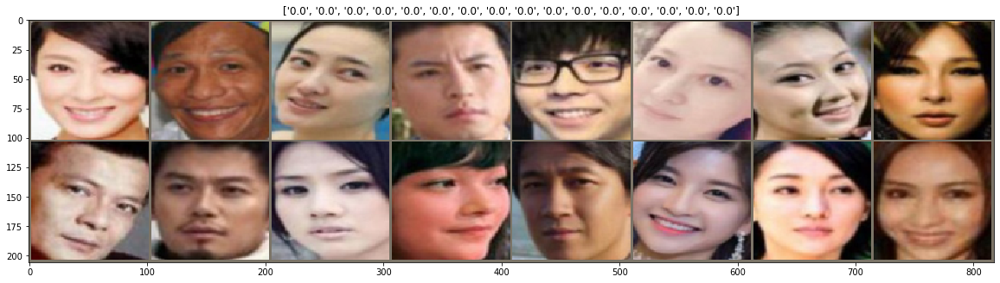

In [9]:
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(20,20))
    plt.imshow(inp)

    if title is not None:
        plt.title(title)
    plt.pause(0.001)
    


inputs, classes = next(iter(dataloaders['train']))
out = utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [63]:
def train_model(model, criterion, optimizer, train_loader, epoch=20):
    
    for epoch in range(1, epoch):
        train_loss = 0.0

        for batch_i, (data, target) in enumerate(train_loader):
            # move tensors to GPU if CUDA is available
            if torch.cuda.is_available:
                data, target = data.cuda(), target.cuda()
            # clear the gradients of all optimized variables
            optimizer.zero_grad()
            # forward pass: compute predicted outputs by passing inputs to the model
            output = model(data)
            # calculate the batch loss
            loss = criterion(output, target)
            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()
            # update training loss 
            train_loss += loss.item()

        print('Epoch %d, loss: %.16f' %(epoch, train_loss))
    
    return model

In [11]:
rn101 = models.resnet101(pretrained=True)
print(rn101)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [12]:
layers_to_freeze = nn.Sequential(*list(rn101.children())[:-1])
for param in layers_to_freeze.parameters():
    param.requires_grad = False

In [17]:
num_frts = rn101.fc.in_features
rn101.fc = nn.Linear(num_frts, len(class_names))

rn101 = rn101.to(device)
criterion = nn.CrossEntropyLoss()

#optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.01, momentum=0.9)
optimizer_ft = optim.Adagrad(rn101.parameters(), lr=0.001)

In [24]:
print(torch.cuda.is_available)

<function is_available at 0x7f78ea52b5f0>


In [26]:
model_ft = train_model(rn101, criterion, optimizer_ft, dataloaders['train'], epoch=20)

Epoch 1, loss: 116.7818002041894943
Epoch 2, loss: 87.5925140585750341
Epoch 3, loss: 74.9188792128115892
Epoch 4, loss: 68.0904367826879025
Epoch 5, loss: 64.1603868086822331
Epoch 6, loss: 60.5054379726061597
Epoch 7, loss: 57.9364154270151630
Epoch 8, loss: 56.4708940363489091
Epoch 9, loss: 54.7798472438007593
Epoch 10, loss: 53.2531966746319085
Epoch 11, loss: 51.7595111714908853
Epoch 12, loss: 50.9806946304743178
Epoch 13, loss: 50.3442207355983555
Epoch 14, loss: 50.0820116400718689
Epoch 15, loss: 48.2840094870189205
Epoch 16, loss: 48.4465184664586559
Epoch 17, loss: 47.0653263274580240
Epoch 18, loss: 46.3003804665058851
Epoch 19, loss: 45.0076984306797385


In [39]:
test_loss = 0.0
class_correct = list(0. for i in range(2))
class_total = list(0. for i in range(2))

rn101.eval() # eval mode

# iterate over test data
for data, target in dataloaders['test']:
    # move tensors to GPU if CUDA is available
    if torch.cuda.is_available:
        data, target = data.cuda(), target.cuda()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = rn101(data)
    # calculate the batch loss
    loss = criterion(output, target)
    # update  test loss 
    test_loss += loss.item()*data.size(0)
    # convert output probabilities to predicted class
    _, pred = torch.max(output, 1)    
    # compare predictions to true label
    correct_tensor = pred.eq(target.data.view_as(pred))
    correct = np.squeeze(correct_tensor.numpy()) if not torch.cuda.is_available else np.squeeze(correct_tensor.cpu().numpy())
    # calculate test accuracy for each object class
    for i in range(len(target)):
        label = target.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

In [45]:
print(type(class_names[0]))

<class 'str'>


In [46]:
# calculate avg test loss

test_loss = test_loss/len(dataloaders['test'].dataset)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(2):
    if class_total[i] > 0:
        if class_names[i] == '0.0':
            cn = 'Non-Masked Class'
        else:
            cn = 'Masked Class'
        print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
            cn, 100 * class_correct[i] / class_total[i],
            np.sum(class_correct[i]), np.sum(class_total[i])))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))

Test Loss: 0.015027

Test Accuracy of Non-Masked Class: 99% (27127/27141)
Test Accuracy of Masked Class: 50% (92/181)

Test Accuracy (Overall): 99% (27219/27322)


In [47]:
torch.save(rn101, './simple_resnet101.pth')

In [70]:
advanced_rn101 = models.resnet101(pretrained=True)
print(advanced_rn101)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [71]:
layers_to_freeze = nn.Sequential(*list(advanced_rn101.children())[:-1])
for param in layers_to_freeze.parameters():
    param.requires_grad = False

In [72]:
num_frts = advanced_rn101.fc.in_features
# rn101.fc = nn.Linear(num_frts, len(class_names))
advanced_rn101.fc = nn.Sequential(
                    nn.Flatten(),
                    nn.Linear(num_frts, 128),
                    nn.ReLU(),
                    nn.Dropout(0.5),
                    nn.Linear(128, len(class_names))
)

advanced_rn101 = advanced_rn101.to(device)
criterion = nn.CrossEntropyLoss()

In [61]:
print(advanced_rn101)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [67]:
def train_model(model, criterion, optimizer, train_loader, epoch=20):
    
    for epoch in range(1, epoch):
        train_loss = 0.0

        for batch_i, (data, target) in enumerate(train_loader):
            # move tensors to GPU if CUDA is available
            if torch.cuda.is_available:
                data, target = data.cuda(), target.cuda()
            # clear the gradients of all optimized variables
            optimizer.zero_grad()
            # forward pass: compute predicted outputs by passing inputs to the model
            output = model(data)
            # calculate the batch loss
            loss = criterion(output, target)
            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()
            # update training loss 
            train_loss += loss.item()

        print('Epoch %d, loss: %.16f' %(epoch, train_loss/len(dataloaders['train'].dataset)))
    
    return model

In [73]:
model_ft = train_model(advanced_rn101, criterion, optimizer_ft, dataloaders['train'], epoch=10)

Epoch 1, loss: 0.0502518972365972
Epoch 2, loss: 0.0502451370366726
Epoch 3, loss: 0.0502564084272558
Epoch 4, loss: 0.0502425681976510
Epoch 5, loss: 0.0502422555480949
Epoch 6, loss: 0.0502376158011526
Epoch 7, loss: 0.0502623780935878
Epoch 8, loss: 0.0502232990555696
Epoch 9, loss: 0.0502661442430416


In [74]:
test_loss = 0.0
class_correct = list(0. for i in range(2))
class_total = list(0. for i in range(2))

advanced_rn101.eval() # eval mode

# iterate over test data
for data, target in dataloaders['test']:
    # move tensors to GPU if CUDA is available
    if torch.cuda.is_available:
        data, target = data.cuda(), target.cuda()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = advanced_rn101(data)
    # calculate the batch loss
    loss = criterion(output, target)
    # update  test loss 
    test_loss += loss.item()*data.size(0)
    # convert output probabilities to predicted class
    _, pred = torch.max(output, 1)    
    # compare predictions to true label
    correct_tensor = pred.eq(target.data.view_as(pred))
    correct = np.squeeze(correct_tensor.numpy()) if not torch.cuda.is_available else np.squeeze(correct_tensor.cpu().numpy())
    # calculate test accuracy for each object class
    for i in range(len(target)):
        label = target.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

In [75]:
# calculate avg test loss

test_loss = test_loss/len(dataloaders['test'].dataset)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(2):
    if class_total[i] > 0:
        if class_names[i] == '0.0':
            cn = 'Non-Masked Class'
        else:
            cn = 'Masked Class'
        print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
            cn, 100 * class_correct[i] / class_total[i],
            np.sum(class_correct[i]), np.sum(class_total[i])))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))

Test Loss: 0.815559

Test Accuracy of Non-Masked Class:  5% (1519/27141)
Test Accuracy of Masked Class: 86% (156/181)

Test Accuracy (Overall):  6% (1675/27322)


In [ ]:
torch.save(advanced_rn101, './advanced_resnet101.pth')

In [76]:
inception = models.inception_v3(pretrained=True)
print(inception)

Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /home/arjun/.cache/torch/checkpoints/inception_v3_google-1a9a5a14.pth



Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, 

In [77]:
layers_to_freeze = nn.Sequential(*list(inception.children())[:-1])
for param in layers_to_freeze.parameters():
    param.requires_grad = False

In [78]:
num_frts = inception.fc.in_features
inception.fc = nn.Sequential(
#                     nn.Flatten(),
#                     nn.Linear(num_frts, 128),
#                     nn.ReLU(),
#                     nn.Dropout(0.5),
                    nn.Linear(num_frts, len(class_names))
)

inception = inception.to(device)
criterion = nn.CrossEntropyLoss()